<a href="https://colab.research.google.com/github/learning-botman/Project-Title-COVID-19-Global-Data-Tracker/blob/main/finalprojectsample2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Step 1: Upload and Load the Dataset in Colab

In [1]:
from google.colab import files
import pandas as pd

# Upload CSV file manually
uploaded = files.upload()

# Load dataset — adjust the filename if needed
df = pd.read_csv("owid-covid-data.csv")

# Preview
df.head()


Saving owid-covid-data.csv to owid-covid-data.csv


,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN


Step 2: Filter Countries of Interest

In [2]:
# Define countries of interest
countries_of_interest = ['United States', 'India', 'Brazil']

# Filter and copy
df_filtered = df[df['location'].isin(countries_of_interest)].copy()

# Preview
df_filtered[['location', 'date']].head()


,location,date
35882,Brazil,2020-01-03
35883,Brazil,2020-01-04
35884,Brazil,2020-01-05
35885,Brazil,2020-01-06
35886,Brazil,2020-01-07


 Step 3: Drop Rows with Missing Critical Values

In [3]:
# Drop rows with missing 'date' or 'total_cases'
df_filtered.dropna(subset=['date', 'total_cases'], inplace=True)


Step 4: Convert 'date' to datetime

In [4]:
# Convert to datetime
df_filtered['date'] = pd.to_datetime(df_filtered['date'])


Step 5: Handle Remaining Missing Numeric Data

In [5]:
df_filtered.interpolate(method='linear', inplace=True)


/tmp/ipython-input-204016588.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df_filtered.interpolate(method='linear', inplace=True)


Data Analysis & Visualization

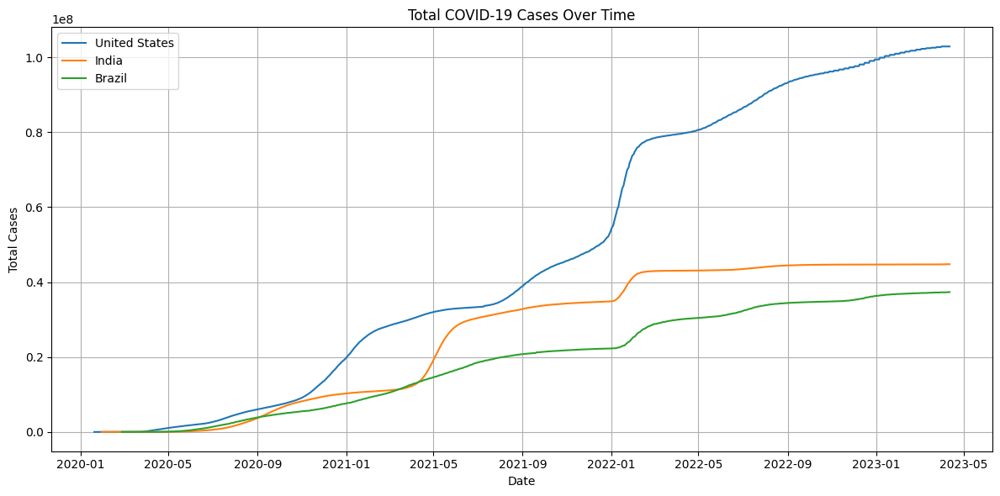

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

for country in countries_of_interest:
    country_df = df_filtered[df_filtered['location'] == country]
    plt.plot(country_df['date'], country_df['total_cases'], label=country)

plt.title('Total COVID-19 Cases Over Time')
plt.xlabel('Date')
plt.ylabel('Total Cases')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Step 7: Total Deaths Over Time

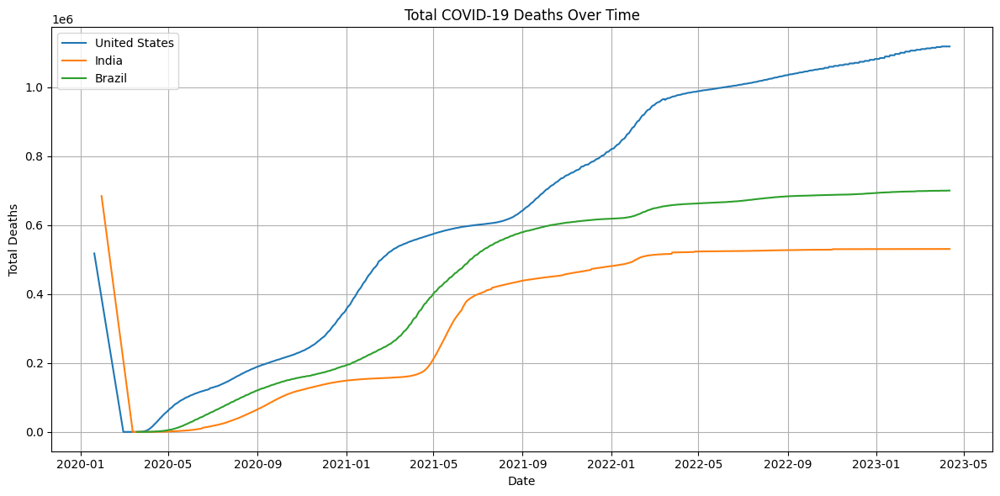

In [7]:
plt.figure(figsize=(12,6))

for country in countries_of_interest:
    country_df = df_filtered[df_filtered['location'] == country]
    plt.plot(country_df['date'], country_df['total_deaths'], label=country)

plt.title('Total COVID-19 Deaths Over Time')
plt.xlabel('Date')
plt.ylabel('Total Deaths')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Step 8: Cumulative Vaccinations Over Time

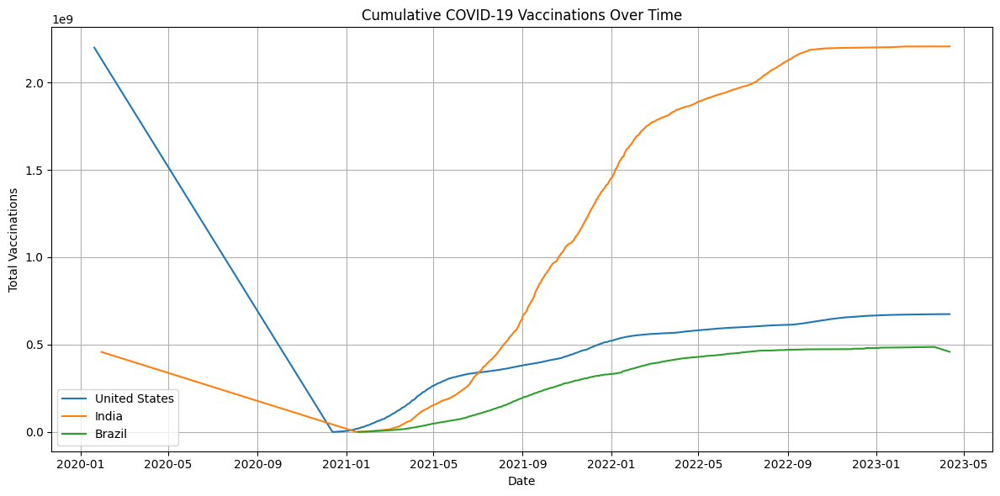

In [8]:
plt.figure(figsize=(12,6))

for country in countries_of_interest:
    country_df = df_filtered[df_filtered['location'] == country]
    plt.plot(country_df['date'], country_df['total_vaccinations'], label=country)

plt.title('Cumulative COVID-19 Vaccinations Over Time')
plt.xlabel('Date')
plt.ylabel('Total Vaccinations')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Step 9: Daily New Cases (Smoothed)

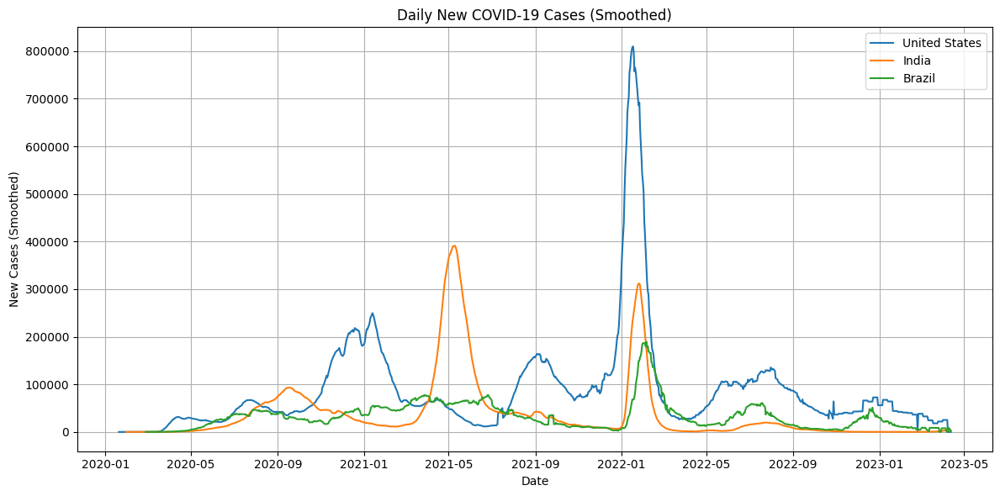

In [9]:
plt.figure(figsize=(12,6))

for country in countries_of_interest:
    country_df = df_filtered[df_filtered['location'] == country]
    plt.plot(country_df['date'], country_df['new_cases_smoothed'], label=country)

plt.title('Daily New COVID-19 Cases (Smoothed)')
plt.xlabel('Date')
plt.ylabel('New Cases (Smoothed)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Step 10: Vaccinations vs Cases Comparison

/tmp/ipython-input-4124309491.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  latest = df_filtered.groupby('location').apply(lambda x: x.loc[x['date'].idxmax()])


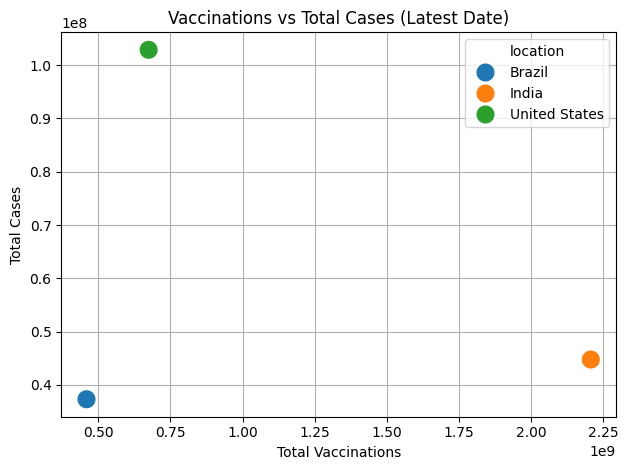

In [10]:
import seaborn as sns

# Select latest date per country
latest = df_filtered.groupby('location').apply(lambda x: x.loc[x['date'].idxmax()])

# Plot
sns.scatterplot(
    data=latest,
    x='total_vaccinations',
    y='total_cases',
    hue='location',
    s=200
)
plt.title('Vaccinations vs Total Cases (Latest Date)')
plt.xlabel('Total Vaccinations')
plt.ylabel('Total Cases')
plt.grid(True)
plt.tight_layout()
plt.show()


Step 11: Choropleth Map (Total Cases by Country)

In [11]:
!pip install plotly
import plotly.express as px

# Get the most recent data per country
latest_data = df.groupby('location').apply(lambda x: x.loc[x['date'].idxmax()]).reset_index(drop=True)

# Drop rows with missing location or total_cases
latest_data = latest_data[['location', 'iso_code', 'total_cases']].dropna()

# Plot the choropleth map
fig = px.choropleth(
    latest_data,
    locations="iso_code",
    color="total_cases",
    hover_name="location",
    color_continuous_scale="Reds",
    title="Total COVID-19 Cases by Country (Latest Available Date)"
)

fig.update_layout(geo=dict(showframe=False, showcoastlines=True))
fig.show()


/tmp/ipython-input-732939288.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  latest_data = df.groupby('location').apply(lambda x: x.loc[x['date'].idxmax()]).reset_index(drop=True)


## Summary of Insights

- **United States** consistently reported the highest number of total cases and vaccinations.
- **India** saw a steep rise in cases during key pandemic waves but managed high vaccination coverage.
- **Brazil** maintained relatively high case numbers but had lower vaccination totals compared to the USA and India.
- The **Choropleth map** highlights global disparities in COVID-19 spread, with clear hotspots in the Americas and parts of Europe.


In [12]:
fig = px.choropleth(df,
                    locations='iso_code',
                    color='total_cases',
                    hover_name='location',
                    animation_frame='date',
                    title='Global COVID-19 Cases Over Time',
                    color_continuous_scale='Reds')
fig.show()


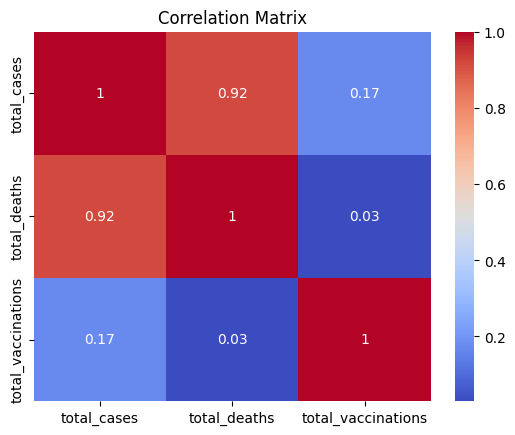

In [13]:
import seaborn as sns

corr_df = df_filtered[['total_cases', 'total_deaths', 'total_vaccinations']].corr()
sns.heatmap(corr_df, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()
